Enter path to image directory: /content/images


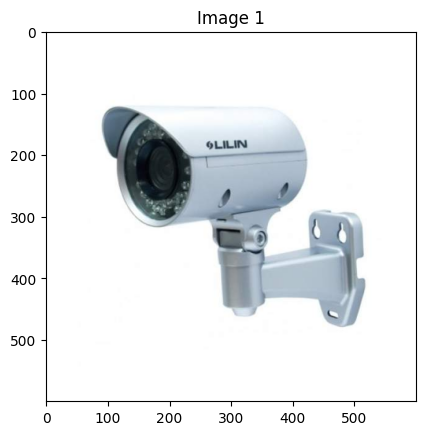

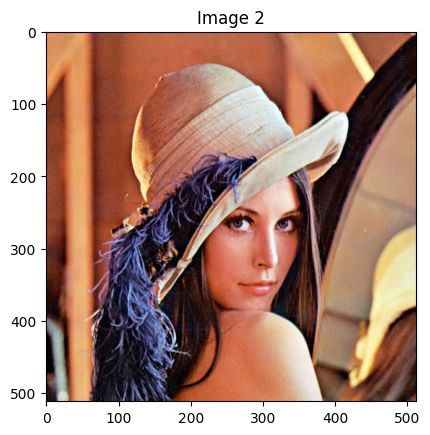

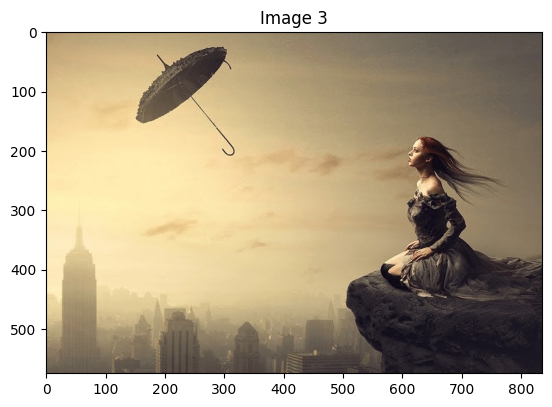

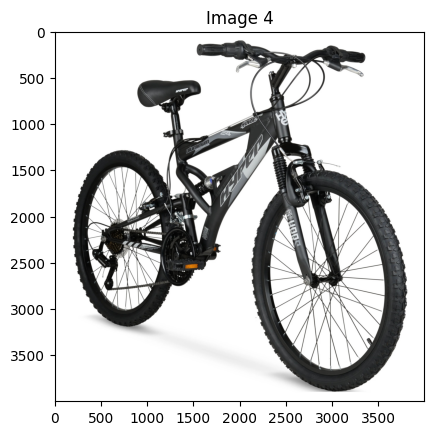

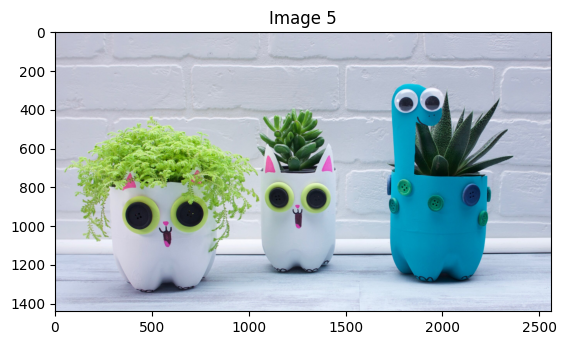

...

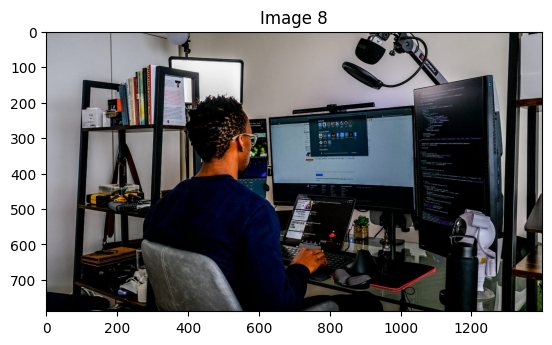

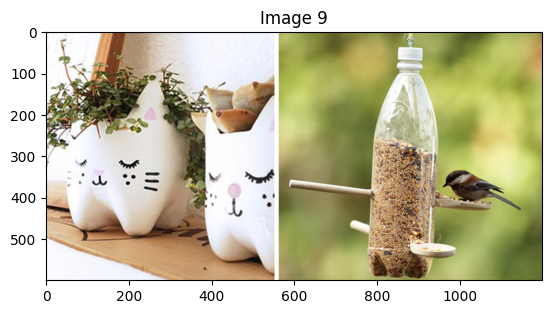

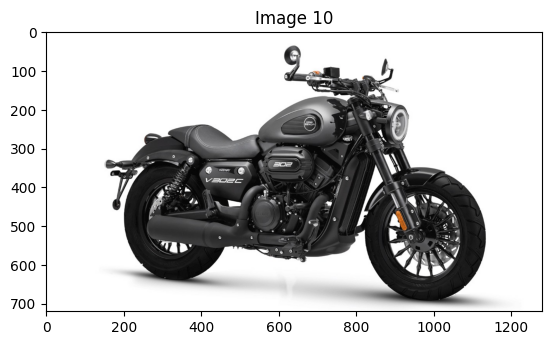

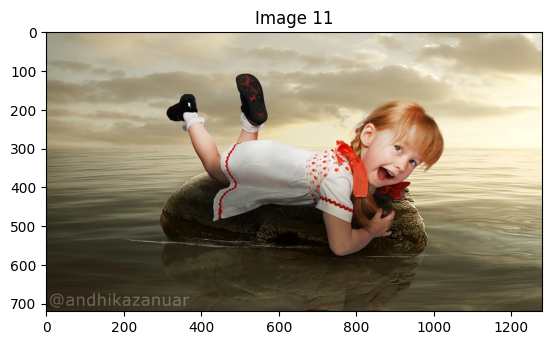

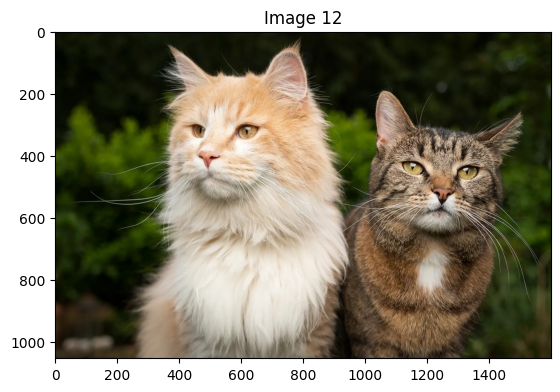

In [10]:
import cv2
import matplotlib.pyplot as plt
import os
dir_path = input("Enter path to image directory: ")
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
    return images

# Example usage:
folder_path = dir_path
loaded_images = load_images_from_folder(folder_path)

# Now you can work with the loaded_images list, for example:
for i, img in enumerate(loaded_images):
   plt.figure(i)
   plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
   plt.title(f"Image {i+1}")
plt.show()

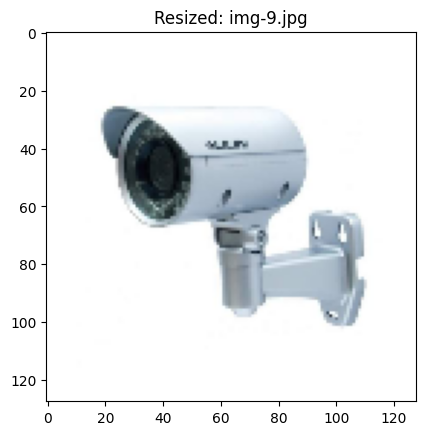

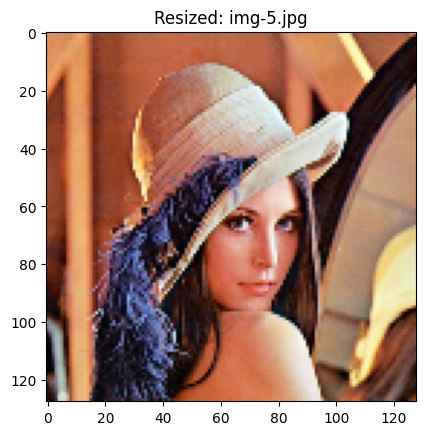

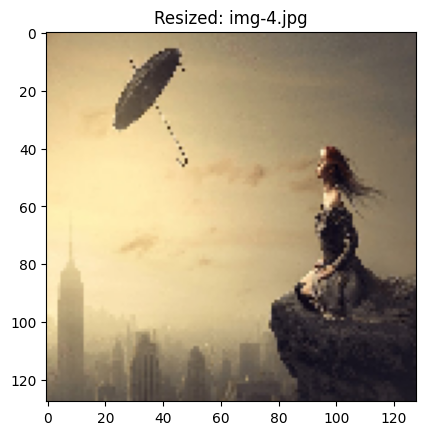

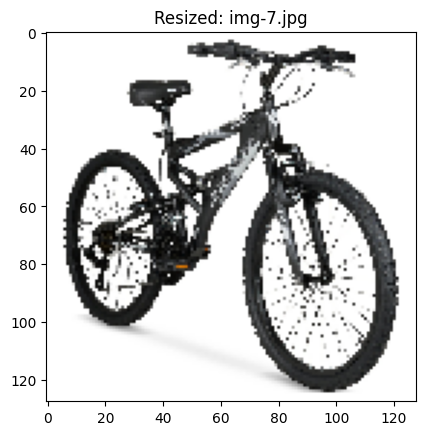

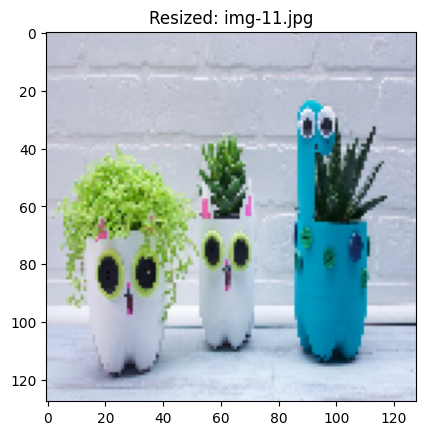

...

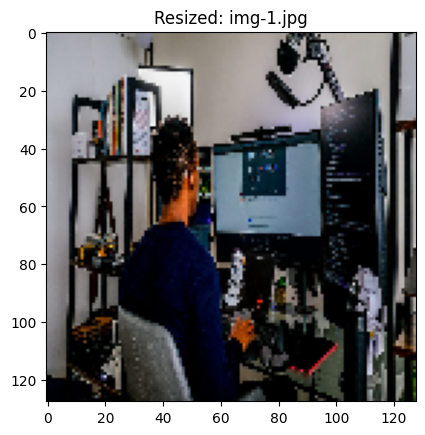

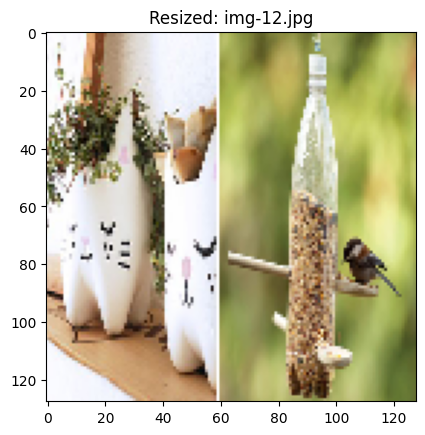

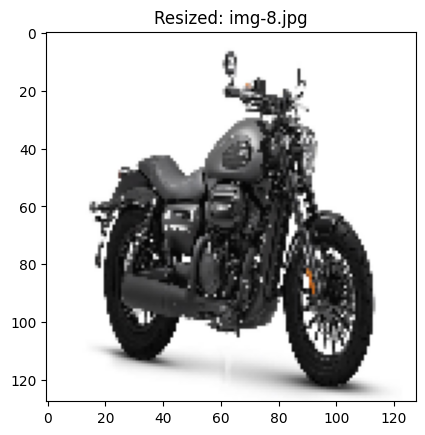

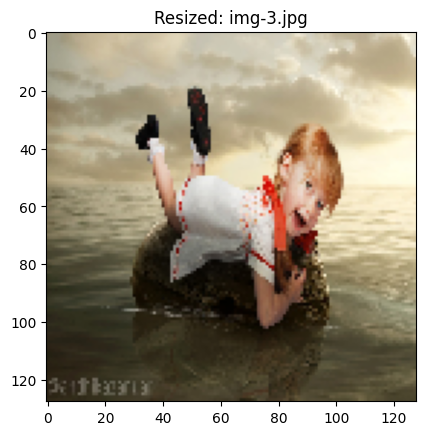

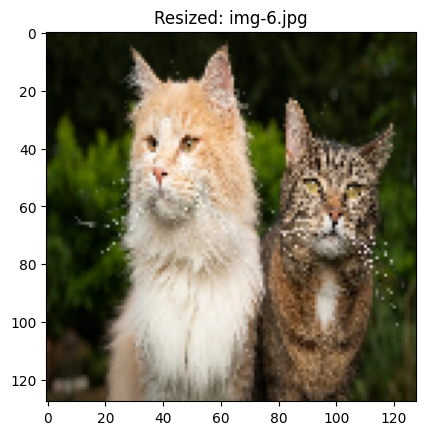

In [11]:
def resize_images_in_folder(folder_path, target_size=(128, 128)):
    resized_images = []
    for filename in os.listdir(folder_path):
        img_path = os.path.join(folder_path, filename)
        try:
            img = cv2.imread(img_path)
            if img is not None:
                resized_img = cv2.resize(img, target_size)
                resized_images.append((filename, resized_img))
        except Exception as e:
            print(f"Error processing {filename}: {e}")
    return resized_images

resized_images = resize_images_in_folder(folder_path)


# Display the resized images (optional):
for filename, img in resized_images:
    plt.figure()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Resized: {filename}")
plt.show()

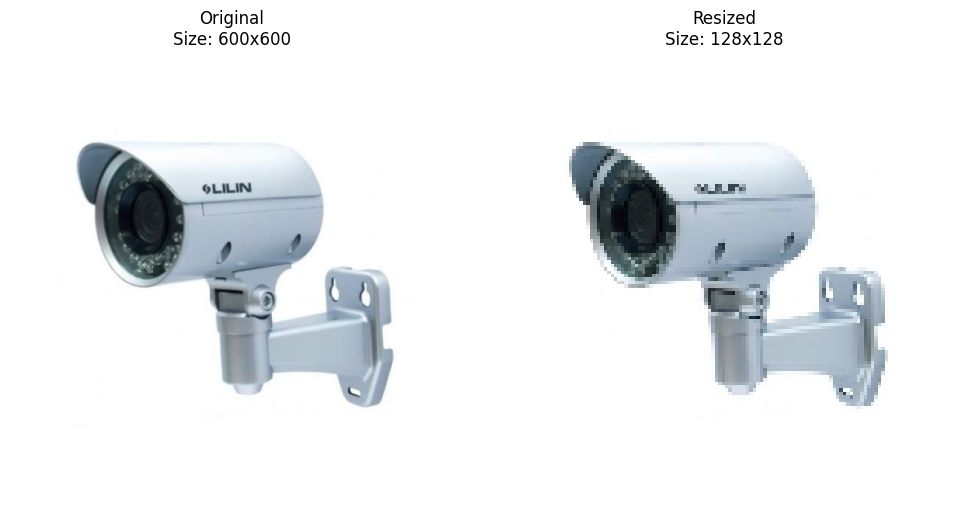

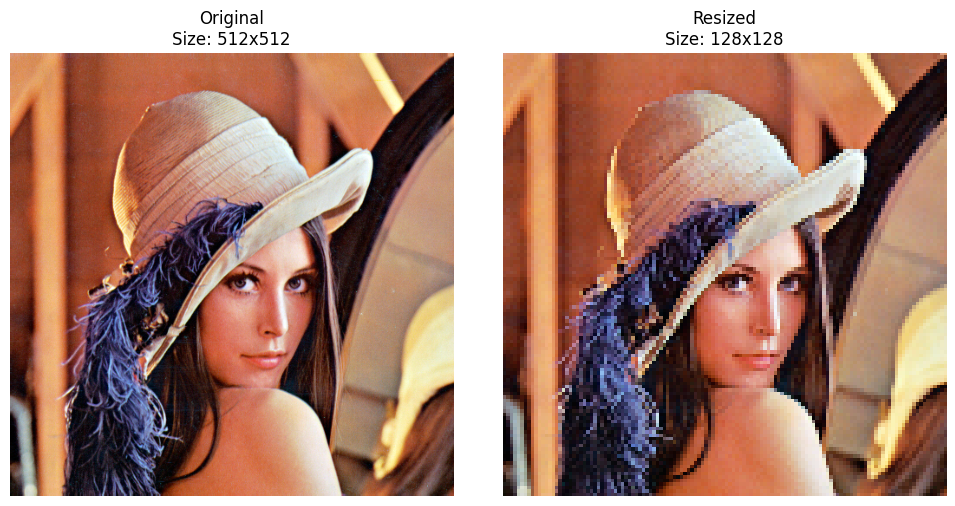

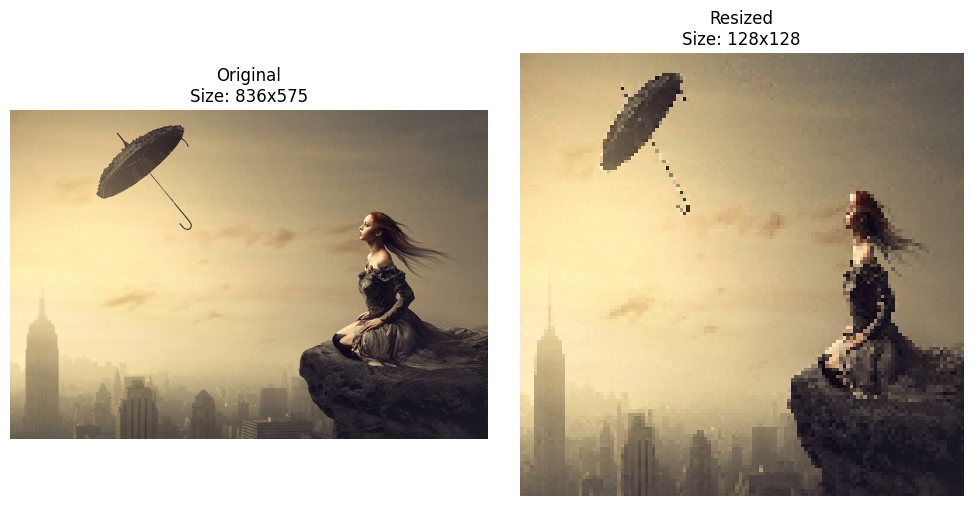

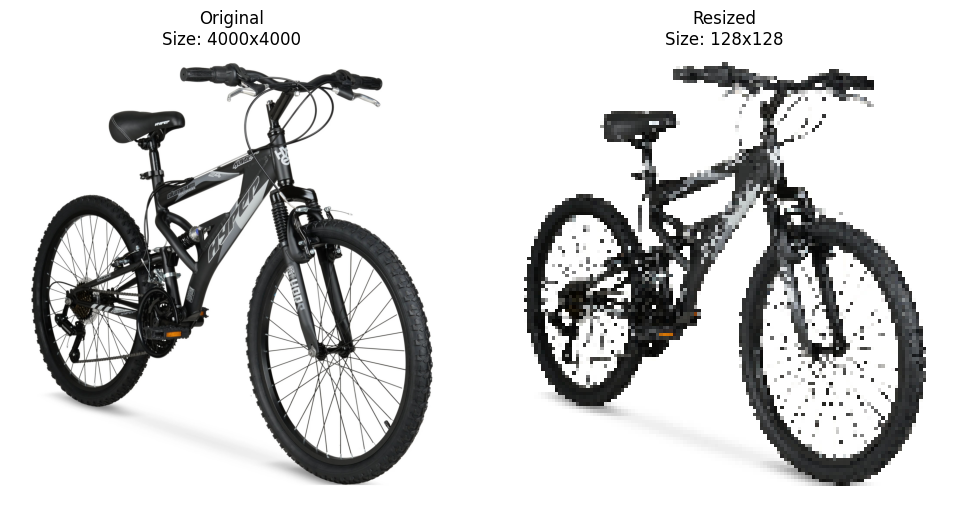

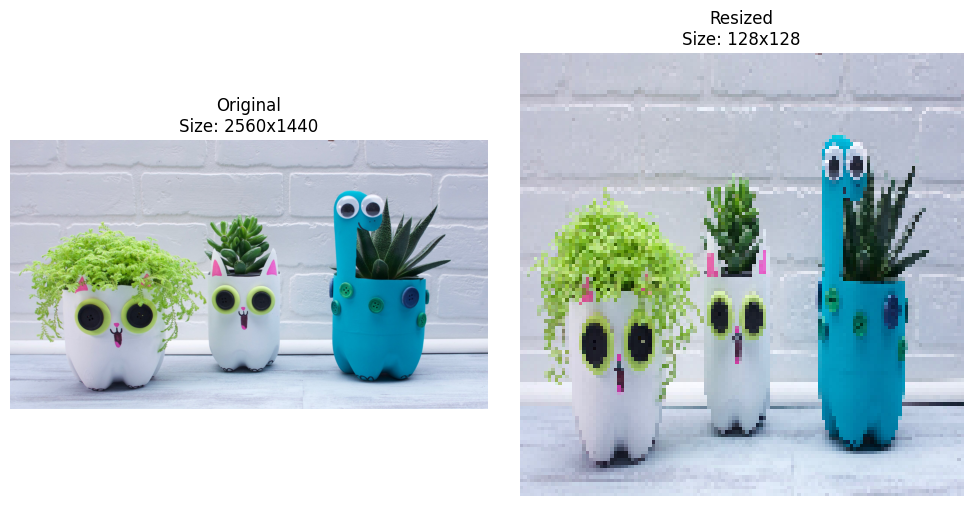

...

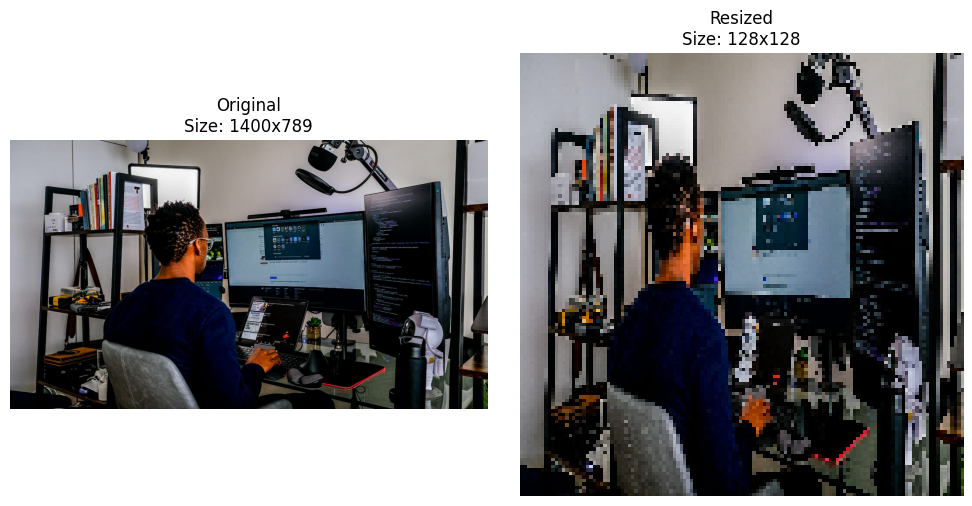

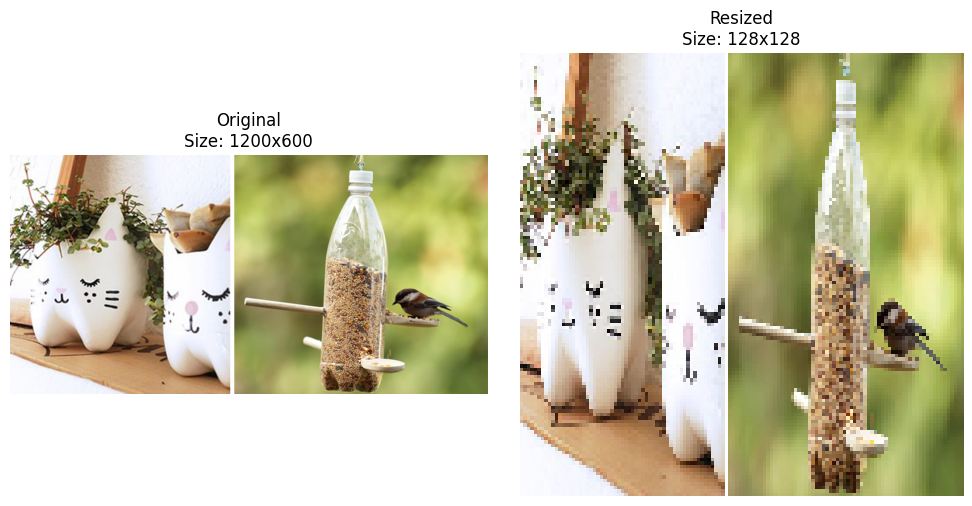

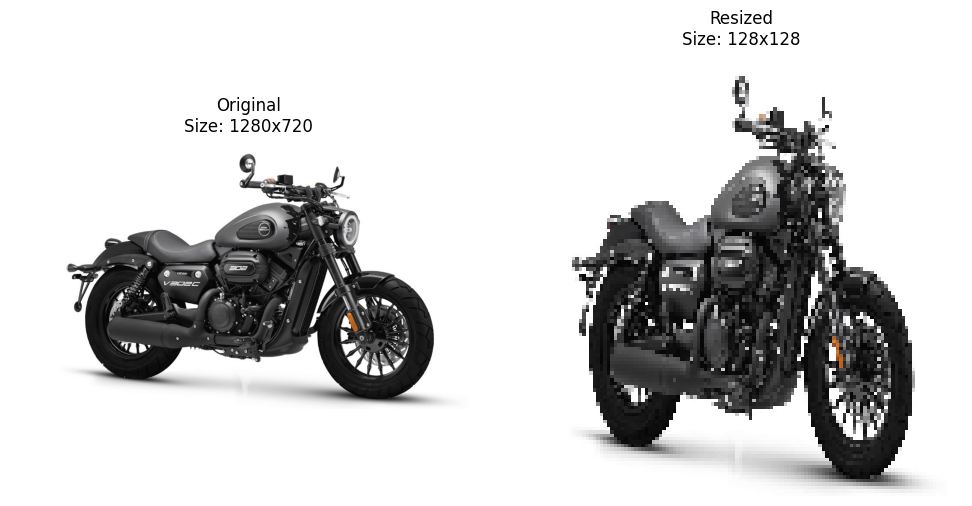

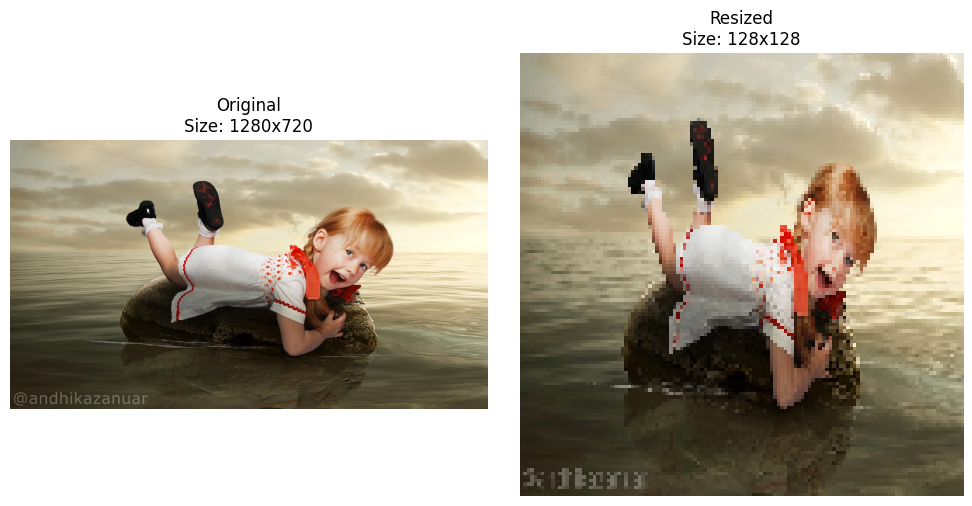

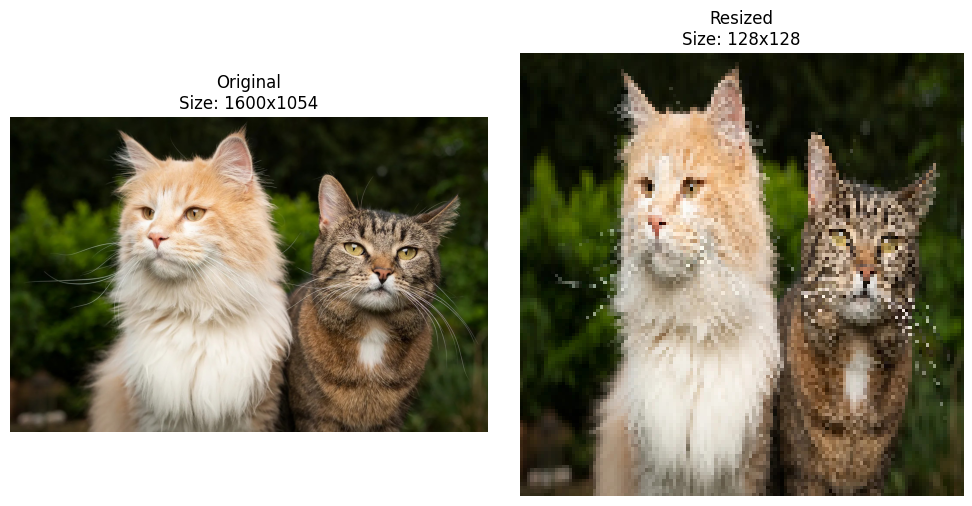

In [12]:
def load_and_resize_images(directory, target_size=(128, 128)):
    """Load images from directory and resize them to target size"""
    images = []
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

    for filename in os.listdir(directory):
        if filename.lower().endswith(valid_extensions):
            file_path = os.path.join(directory, filename)
            img = cv2.imread(file_path)
            if img is not None:
                # Resize image while maintaining color channels
                resized = cv2.resize(img, target_size)
                images.append({
                    'name': filename,
                    'original': img,
                    'resized': resized,
                    'original_size': img.shape[:2][::-1],  # (width, height)
                    'new_size': target_size
                })
            else:
                print(f"Could not read image: {filename}")
    return images
def display_comparison(original, resized):
    #Display original and resized images side by side
    # Convert BGR to RGB for matplotlib
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    resized_rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(original_rgb)
    plt.title(f"Original\nSize: {original.shape[1]}x{original.shape[0]}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(resized_rgb)
    plt.title(f"Resized\nSize: {resized.shape[1]}x{resized.shape[0]}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


image_data = load_and_resize_images(dir_path)
def main():
    if not image_data:
        print("No valid images found in directory.")
        return

    # Display information for each image
    for img in image_data:

        # Display comparison
        display_comparison(img['original'], img['resized'])

if __name__ == "__main__":
    main()

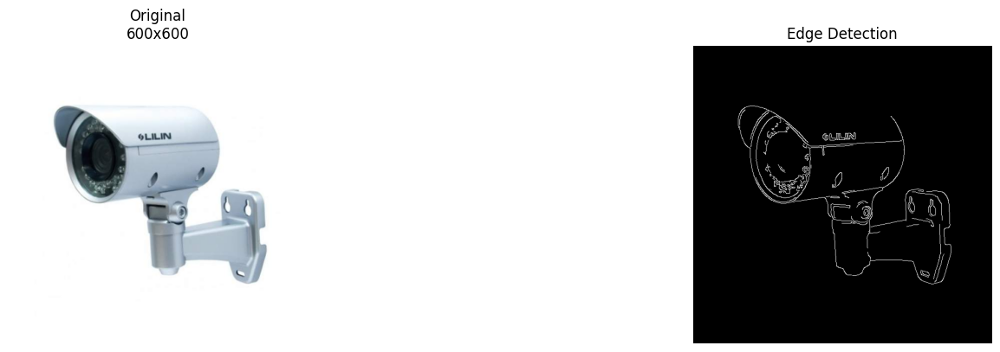

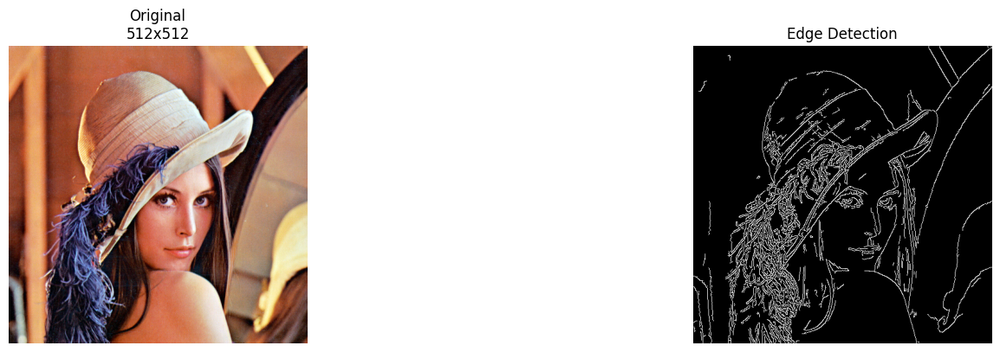

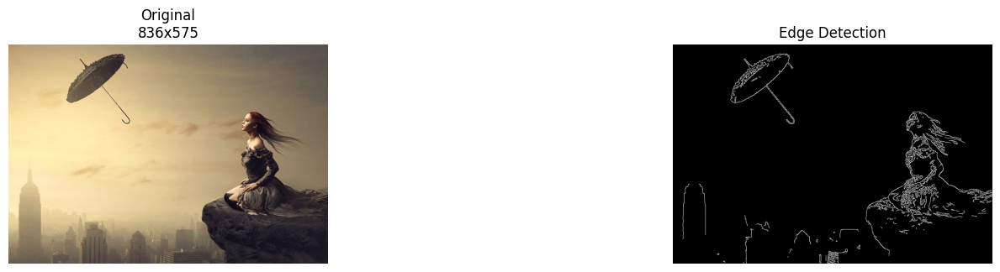

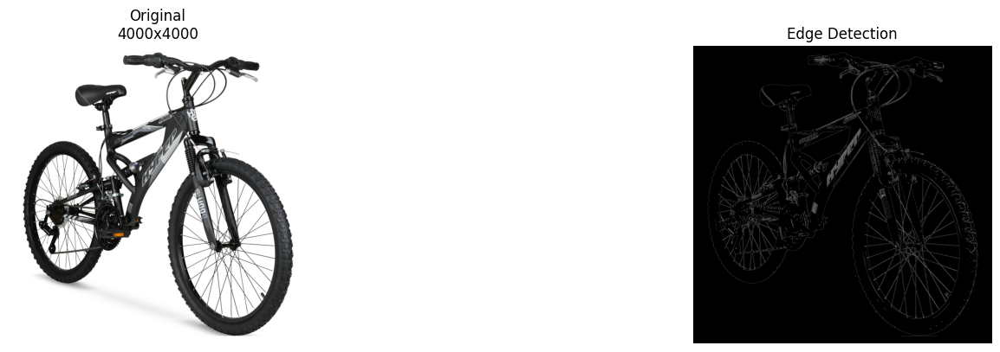

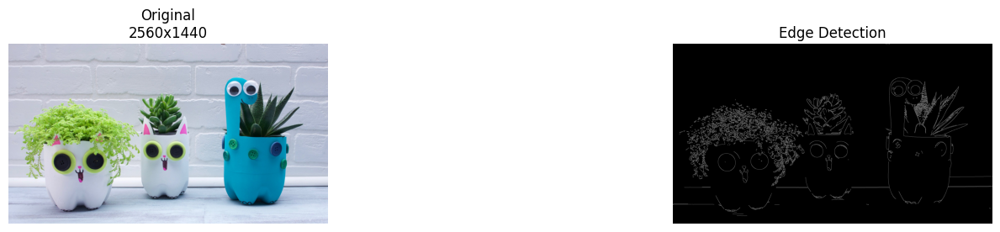

...

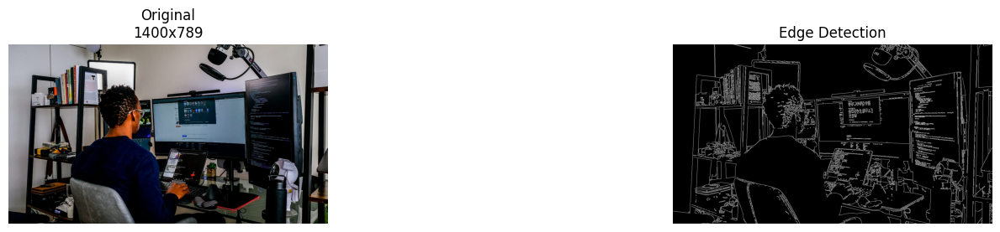

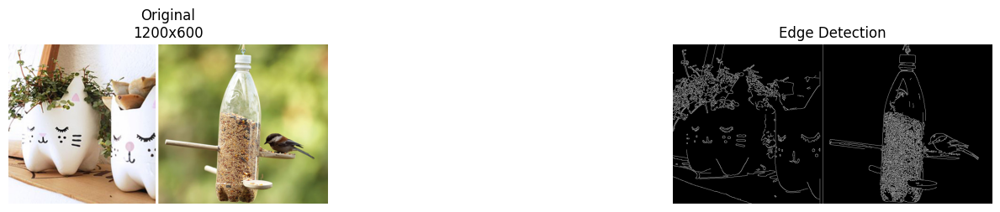

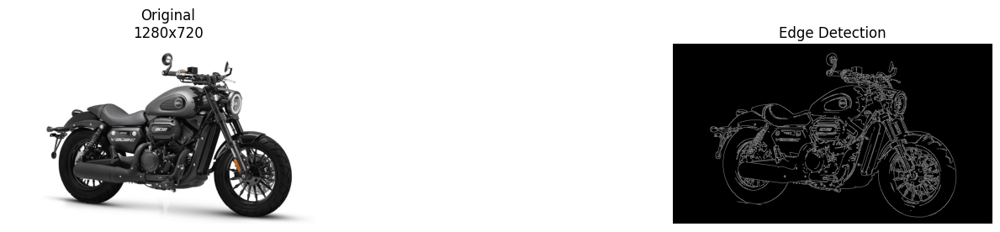

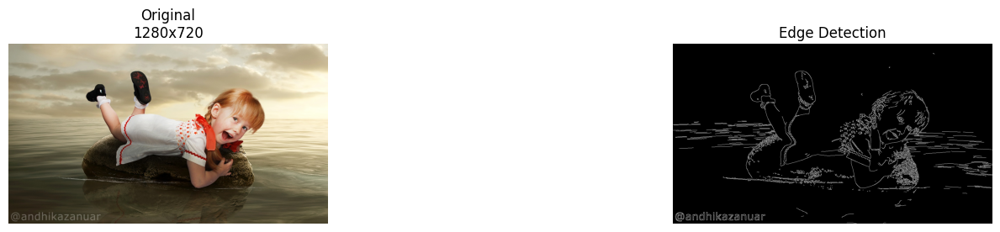

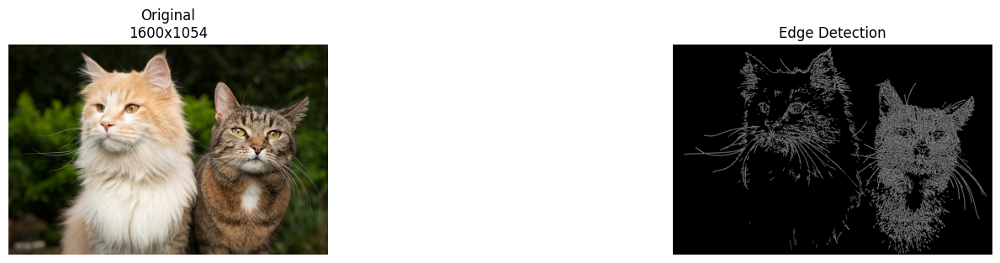

In [17]:
def process_images(image_dir):
    images = load_images(image_dir)

    for filename, img in images:
        # Edge detection
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        edges = cv2.Canny(gray, 100, 200)

        # Create visualizations
        plt.figure(figsize=(12, 4))

        # Original image (convert BGR to RGB for matplotlib)
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f'Original\n{img.shape[1]}x{img.shape[0]}')
        plt.axis('off')

        # Edge detection
        plt.subplot(1, 3, 3)
        plt.imshow(edges, cmap='gray')
        plt.title('Edge Detection')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    process_images(IMAGE_DIRECTORY)

In [18]:
for img in image_data:
        print(f"\nImage: {img['name']}")
        print(f"Original size: {img['original_size'][0]}x{img['original_size'][1]}")
        print(f"New size: {img['new_size'][0]}x{img['new_size'][1]}")



Image: img-9.jpg
Original size: 600x600
New size: 128x128

Image: img-5.jpg
Original size: 512x512
New size: 128x128

Image: img-4.jpg
Original size: 836x575
New size: 128x128

Image: img-7.jpg
Original size: 4000x4000
New size: 128x128

Image: img-11.jpg
Original size: 2560x1440
New size: 128x128

Image: img-10.jpg
Original size: 1440x810
New size: 128x128

Image: img-2.jpg
Original size: 717x478
New size: 128x128

Image: img-1.jpg
Original size: 1400x789
New size: 128x128

Image: img-12.jpg
Original size: 1200x600
New size: 128x128

Image: img-8.jpg
Original size: 1280x720
New size: 128x128

Image: img-3.jpg
Original size: 1280x720
New size: 128x128

Image: img-6.jpg
Original size: 1600x1054
New size: 128x128
